In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import scanorama
import json
import os

sc.settings.set_figure_params(dpi=80)
# sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

KeyboardInterrupt: 

### Туториал

In [ ]:
adata = sc.read_h5ad('results/spatial_transcriptomics/human.h5ad')
adata

In [ ]:
samples = adata.uns['spatial'].keys()
samples

In [ ]:
for library_id in adata.uns['spatial'].keys():
    sq.pl.spatial_scatter(adata, library_id=library_id)

In [5]:
# add info on mitochondrial and hemoglobin genes to the objects.
adata.var['mt'] = adata.var_names.str.startswith('MT-')
adata.var['hb'] = adata.var_names.str.contains(("^HB[AB]"))
adata.var['ribo'] = adata.var_names.str.contains(("^RP[LS]"))

sc.pp.calculate_qc_metrics(
    adata, qc_vars=['mt','hb','ribo'],
    percent_top=None, log1p=False, inplace=True)

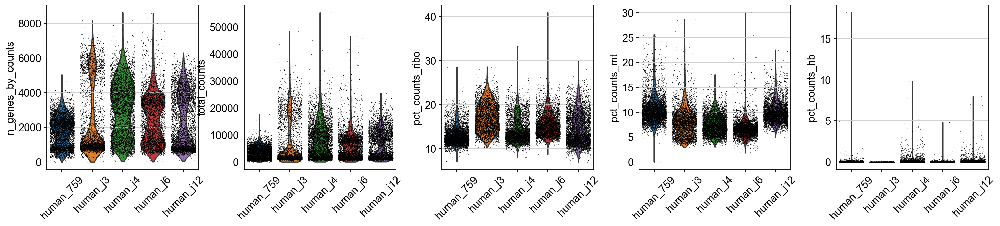

In [21]:
sc.pl.violin(adata,
             keys = ['n_genes_by_counts', 'total_counts','pct_counts_ribo',
                     'pct_counts_mt', 'pct_counts_hb'],
             jitter=0.4, groupby = 'sample_id', rotation= 45, save='qc.png')

In [11]:
adata.obs

,in_tissue,array_row,array_col,sample_id,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_hb,pct_counts_hb,total_counts_ribo,pct_counts_ribo
AAACAAGTATCTCCCA-1,1,50,102,human_759,838,1245.0,115.0,9.236947,0.0,0.000000,169.0,13.574298
AAACAATCTACTAGCA-1,1,3,43,human_759,2757,6195.0,652.0,10.524616,1.0,0.016142,805.0,12.994350
AAACACCAATAACTGC-1,1,59,19,human_759,2941,6398.0,626.0,9.784307,0.0,0.000000,700.0,10.940919
AAACAGAGCGACTCCT-1,1,14,94,human_759,2412,5125.0,523.0,10.204878,0.0,0.000000,677.0,13.209756
AAACAGTGTTCCTGGG-1,1,73,43,human_759,805,1248.0,185.0,14.823718,0.0,0.000000,161.0,12.900641
...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCTAGATACGCT-1,1,21,3,human_j6,1653,2773.0,181.0,6.527227,7.0,0.252434,375.0,13.523260
TTGTTGTGTGTCAAGA-1,1,31,77,human_j6,2553,5227.0,394.0,7.537785,0.0,0.000000,760.0,14.539888
TTGTTTCACATCCAGG-1,1,58,42,human_j6,2844,6621.0,426.0,6.434073,0.0,0.000000,1222.0,18.456427
TTGTTTCATTAGTCTA-1,1,60,30,human_j6,1112,1828.0,202.0,11.050328,0.0,0.000000,291.0,15.919037


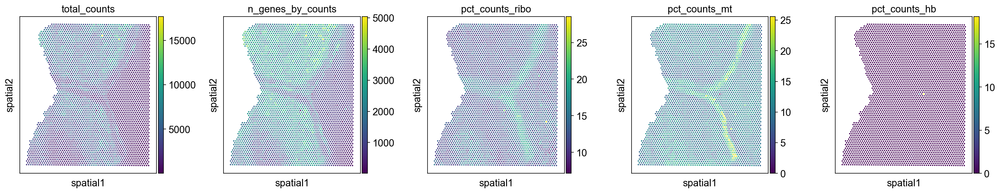

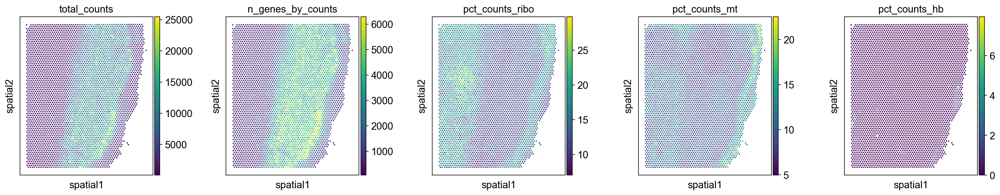

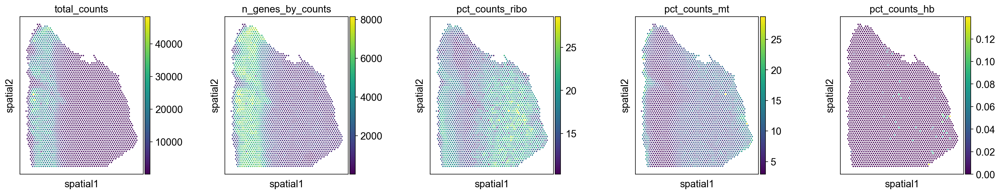

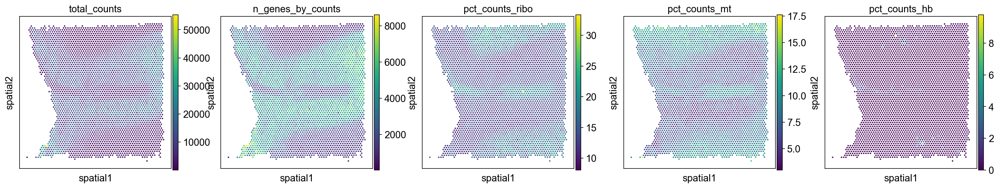

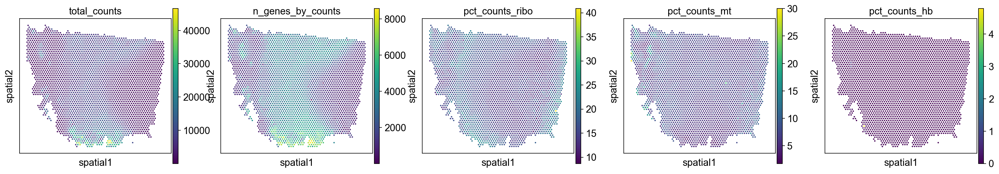

In [12]:
for library_id in adata.uns['spatial'].keys():
    sq.pl.spatial_scatter(adata, library_id=library_id, color = [
            'total_counts', 'n_genes_by_counts','pct_counts_ribo',
            'pct_counts_mt', 'pct_counts_hb'], ncols=5, library_key='sample_id',
        img=False)

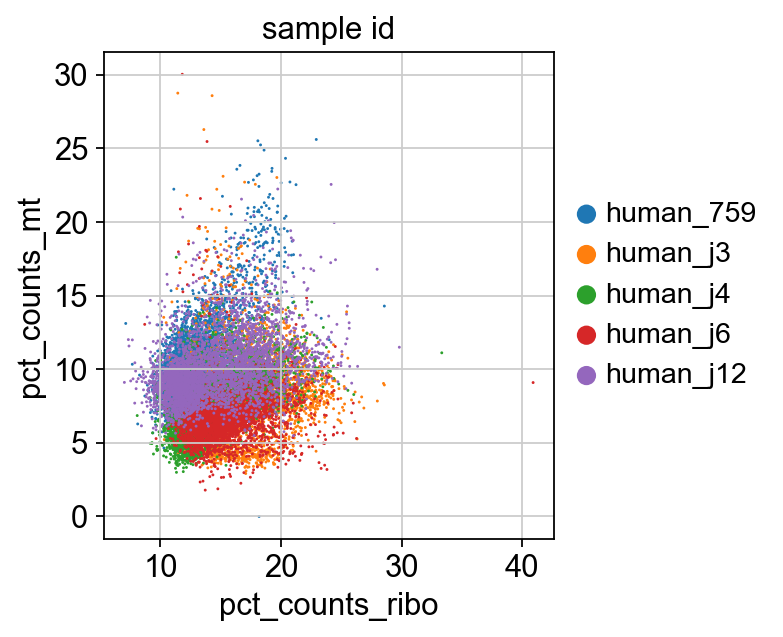

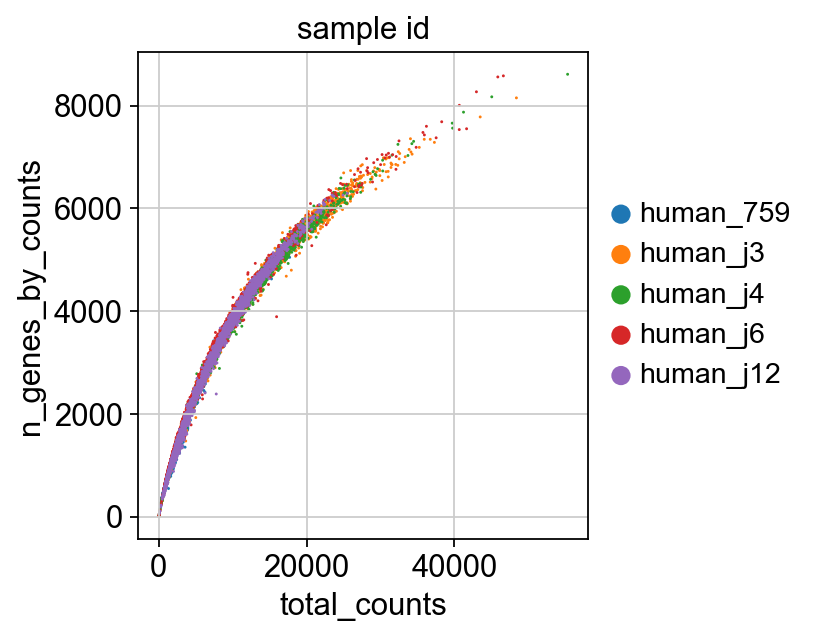

In [13]:
sc.pl.scatter(adata, x='pct_counts_ribo', y='pct_counts_mt', color="sample_id")
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color="sample_id")

normalizing counts per cell
    finished (0:00:00)


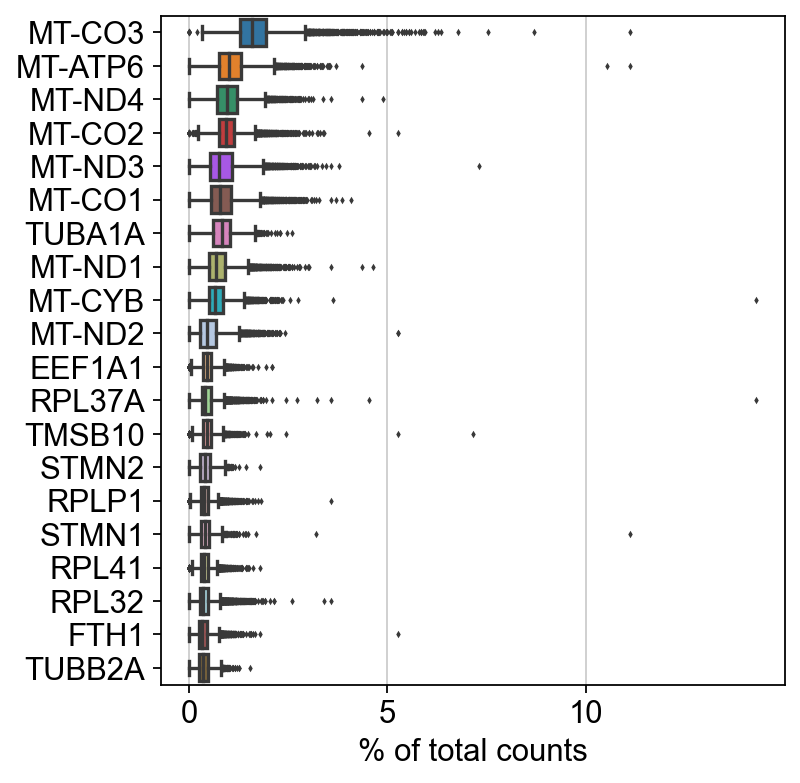

In [14]:
sc.pl.highest_expr_genes(adata, n_top=20)

### Подгрузим данные разметки

In [38]:
samples

dict_keys(['human_759', 'human_j12', 'human_j3', 'human_j4', 'human_j6'])

In [41]:
pd.read_csv('data/clusters/human_j3.csv', index_col=0)

,H_j3
Barcode,
AAACAAGTATCTCCCA-1,WM
AAACACCAATAACTGC-1,L3
AAACAGGGTCTATATT-1,L1
AAACAGTGTTCCTGGG-1,L6b
AAACATTTCCCGGATT-1,WM
...,...
TTGTTGTGTGTCAAGA-1,WM
TTGTTTCACATCCAGG-1,WM
TTGTTTCATTAGTCTA-1,L5


Index(['AAACAATCTACTAGCA-1', 'AAACACCAATAACTGC-1', 'AAACAGAGCGACTCCT-1',
       'AAACAGTGTTCCTGGG-1', 'AAACCGTTCGTCCAGG-1', 'AAACCTAAGCAGCCGG-1',
       'AAACGAAGAACATACC-1', 'AAACGAGACGGTTGAT-1', 'AAACGCCCGAGATCGG-1',
       'AAACGGTTGCGAACTG-1',
       ...
       'TTGTGGTGGTACTAAG-1', 'TTGTGTATGCCACCAA-1', 'TTGTGTTTCCCGAAAG-1',
       'TTGTTAGCAAATTCGA-1', 'TTGTTCAGTGTGCTAC-1', 'TTGTTCTAGATACGCT-1',
       'TTGTTGTGTGTCAAGA-1', 'TTGTTTCACATCCAGG-1', 'TTGTTTCATTAGTCTA-1',
       'TTGTTTCCATACAACT-1'],
      dtype='object', length=12673)